# Importing Libraries




In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pdp

from sklearn import preprocessing
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import neighbors
from sklearn.svm import SVC

#from sklearn.model_selection import 
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_score, train_test_split, KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import make_scorer

# Neural Net modules
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
from sklearn import metrics


from sklearn.preprocessing import scale
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler


from sklearn import svm

from math import sqrt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings



C:\Users\fenix\AppData\Local\Temp/ipykernel_8092/2353635900.py:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pdp


# Data analysis and visualizations


In [2]:
##!conda install -c conda-forge pandas-profiling
#conda install -c conda-forge pandas-profiling
#-m pip install pandas-profiling
#import sys
#!{sys.executable} -m pip install pandas-profiling

In [3]:
npl=pd.read_csv("data_NPLs.csv")
roe=pd.read_csv("data_ROE.csv")
assets=pd.read_csv("data_ASSETS.csv")
roa=pd.read_csv("SDW_data_28Mar2023.19.20.28_Roa.csv")
qgdp=pd.read_csv("GDP.csv")
unemployement=pd.read_csv("SDW_data_13Mar2023.00.02.54_unemployement.csv")
gov_deb=pd.read_csv("SDW_data_13Mar2023.00.07.16_gov_deb.csv")
interest_rate=pd.read_csv("MEI_FIN_29032023200126148.csv")
exchange_rate=pd.read_csv("DP_LIVE_13032023013005788.csv")
cpi=pd.read_csv("DP_LIVE_13032023011415775.csv")
#df = pd.read_csv("road_collisions.csv")

In [4]:
npl=npl.melt(id_vars=["Date"],
                 var_name="Country",
                 value_name="npl")
roe=roe.melt(id_vars=["Date"],
                 var_name="Country",
                 value_name="roe")
assets=assets.melt(id_vars=["Date"],
                 var_name="Country",
                 value_name="assets")
roa=roa.melt(id_vars=["Date"],
                 var_name="Country",
                 value_name="roa")
unemployement=unemployement.melt(id_vars=["Date"],
                 var_name="Country",
                 value_name="unemployement")
gov_deb=gov_deb.melt(id_vars=["Year"],
                 var_name="Country",
                 value_name="gov_deb")
#borrowing_rate=borrowing_rate.melt(id_vars=["Country"],
                 #var_name="Date",
                 #value_name="borrowing_rate")


In [5]:

npl['Year'] = npl['Date'].str.extract(r'^(\d{4})', expand=False)
npl['Year'] = npl.Year.astype(int)
npl['Quarter'] = npl['Date'].str[-1:]
npl['Quarter'] = npl.Quarter.astype(int)

In [6]:
#df = pd.concat([npl, roe])
df = pd.merge(npl,roe, on =["Date","Country"]).merge(assets,how="left",on=["Date","Country"]).merge(roa,how="left",on=["Date","Country"])\
.merge(qgdp,how="left",on=["Date","Country"]).merge(unemployement,how="left",on=["Date","Country"]).merge(gov_deb,how="left",on=["Year","Country"])\
.merge(exchange_rate,how="left",on=["Year","Country"]).merge(cpi,how="left",on=["Date","Country"]).merge(interest_rate,how="left",on=["Date","Country"])
df.tail()

,Date,Country,npl,Year,Quarter,roe,assets,roa,QGDP,unemployement,gov_deb,exchange_rate,CPI,int_rate
859,2015Q4,Slovakia,8.5921,2015,4,6.6423,10043235.00,0.929473,-0.015452,10.266752,53.491267,0.901296,-0.589834,0.726333
860,2015Q3,Slovakia,9.6953,2015,3,6.5684,9953691.00,0.802969,0.596845,10.835565,53.491267,0.901296,-0.457696,1.044667
861,2015Q2,Slovakia,10.0807,2015,2,4.657,9751775.00,0.552611,0.814131,11.272292,53.491267,0.901296,-0.655101,1.010000
862,2015Q1,Slovakia,10.2405,2015,1,1.8335,9703237.00,0.263075,0.447375,11.569774,53.491267,0.901296,-0.397608,0.760000
863,2014Q4,Slovakia,9.9123,2014,4,5.2155,9835376.00,0.896986,0.061493,12.123706,54.692541,0.752728,-0.096004,1.334966


In [7]:
#df['Year'] = df['Date'].str.extract(r'^(\d{4})', expand=False)
cols = ['npl', 'roe']
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce', axis=1)
df['assets'] = df.assets.astype(float)

In [8]:
prof = pdp.ProfileReport(df)
prof.to_file(output_file='report.html')
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Data cleaning



In [9]:
filtered_df = df[df['npl'].isnull()]
filtered_df.head(15)

,Date,Country,npl,Year,Quarter,roe,assets,roa,QGDP,unemployement,gov_deb,exchange_rate,CPI,int_rate
94,2015Q1,Bulgaria,NaN,2015,1,0.6534,10851320.0,0.359309,1.009244,10.647512,27.005288,1.764400,-0.351735,1.143467
155,2015Q4,Czech Republic,NaN,2015,4,8.1902,13209726.0,1.172049,0.593513,4.168332,41.854255,24.598750,0.100402,0.513333
156,2015Q3,Czech Republic,NaN,2015,3,8.7334,17646113.0,0.901275,1.210334,4.542677,41.854255,24.598750,0.367279,0.796667
157,2015Q2,Czech Republic,NaN,2015,2,6.1338,14572418.0,0.640646,1.358044,4.824997,41.854255,24.598750,0.668896,0.623333
158,2015Q1,Czech Republic,NaN,2015,1,3.7344,15448904.0,0.335372,1.894335,5.123301,41.854255,24.598750,0.100435,0.366667
159,2014Q4,Czech Republic,NaN,2014,4,7.7070,15812945.0,1.181485,1.146458,5.712604,44.420250,20.757500,0.436975,0.880000
852,2017Q3,Slovakia,NaN,2017,3,4.2828,11999669.0,0.699836,0.912391,7.649569,52.274528,0.885206,1.194278,0.856992
853,2017Q2,Slovakia,NaN,2017,2,3.2817,12142776.0,0.497923,1.233234,7.811974,52.274528,0.885206,1.398439,0.984319
854,2017Q1,Slovakia,NaN,2017,1,1.4771,12150934.0,0.234455,1.731681,8.273951,52.274528,0.885206,1.804359,1.068790
855,2016Q4,Slovakia,NaN,2016,4,3.6939,12013682.0,0.884281,0.766207,8.602073,51.684814,0.903421,0.583333,0.717882


In [10]:
#p = sns.pairplot(df, x_vars=['unemployement','int_rate','CPI'], y_vars='npl', size=7, aspect=0.7)

In [11]:
df = df.dropna() #reemplaze

<AxesSubplot:>

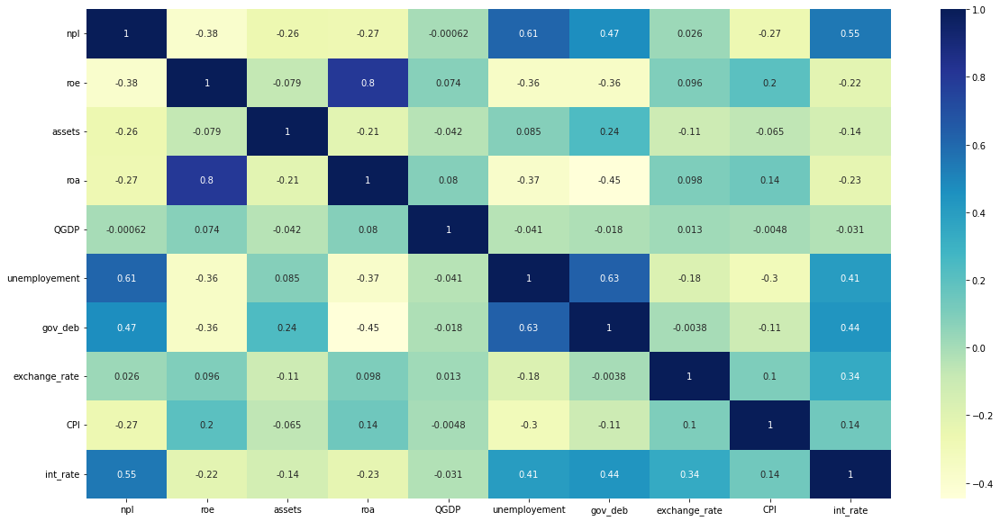

In [12]:
plt.figure(figsize=(20,10)) 
df_r = df.drop(["Date", "Year","Quarter"], axis=1)
c = df_r.corr()
sns.heatmap(c,cmap="YlGnBu",annot=True)

In [13]:
#df_r = df.drop(["Date","Year","Quarter"], axis=1)
df = df.drop(["Date"], axis=1)

In [14]:
dict_df = {}
country_name = []
for item in df_r['Country'].unique():
    df1 = df_r.loc[df_r['Country'] == item]
    if df1.shape[0] > 1:
            dict_df[item] = df1
            country_name.append(item)
            
#dict_df = {}
#country_name = []
#for item in dataset4['country'].unique():
    #df = dataset4.loc[dataset4['country'] == item]
    #if df.shape[0] > 50:
            #dict_df[item] = df
            #country_name.append(item)            

In [15]:
if 'Country' in dict_df['Cyprus']:
    for item in country_name:
        dict_df[item] = dict_df[item].drop(['Country'], axis=1)
dict_df['Cyprus'].head()

,npl,roe,assets,roa,QGDP,unemployement,gov_deb,exchange_rate,CPI,int_rate
96,5.0159,0.6374,51000143.0,-0.054710,0.447603,7.179082,101.049590,0.949624,10.290570,2.321567
97,5.4937,2.1092,50494783.0,0.083044,0.469411,6.809517,101.049590,0.949624,8.827782,1.960200
98,5.5947,0.1727,50678413.0,0.013391,0.217769,6.649909,101.049590,0.949624,6.547396,0.844167
99,5.4148,1.4408,52628055.0,-0.100370,1.388461,6.387239,113.506342,0.845494,4.938272,0.314600
100,7.6604,1.7642,52340384.0,0.034359,1.181321,6.674695,113.506342,0.845494,3.089958,0.140167


In [16]:
aux = []
for item in country_name:
    if dict_df[item]['npl'].quantile(0.50) < 1:
        del dict_df[item]
        aux.append(item)
for x in aux:
    country_name.remove(x)
print('Number of Countries: ', len(country_name))
print(country_name)


#aux = []
#for item in country_name:
    #if dict_df[item]['suicides/100k pop'].quantile(0.50) < 5:
        #del dict_df[item]
        #aux.append(item)
#for x in aux:
    #country_name.remove(x)
#print('Número de países: ', len(country_name))
#print(country_name)

Number of Countries:  27
['Austria', 'Belgium', 'Bulgaria', 'Cyprus', 'Czech Republic', 'Germany', 'Denmark', 'Estonia', 'Spain', 'Finland', 'France', 'Greece', 'Croatia', 'Hungary', 'Ireland', 'Italy', 'Lithuania', 'Luxembourg', 'Latvia', 'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Sweden', 'Slovenia', 'Slovakia']


In [17]:
#dict_df['Ireland'].head()

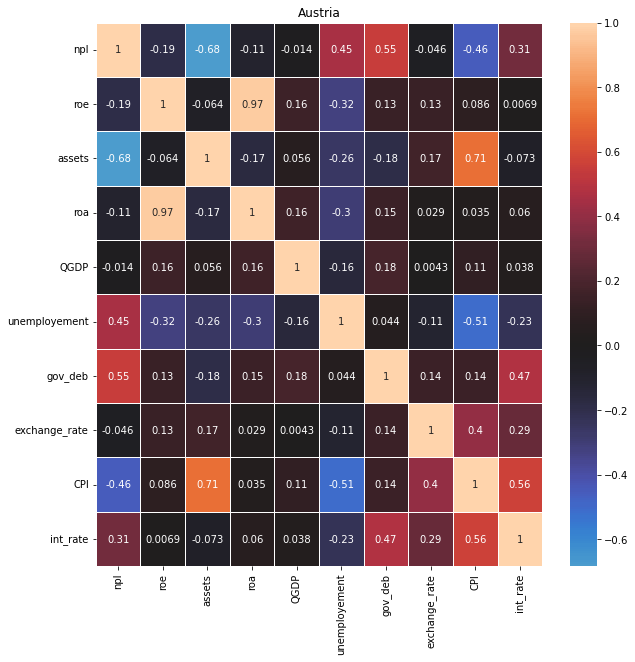

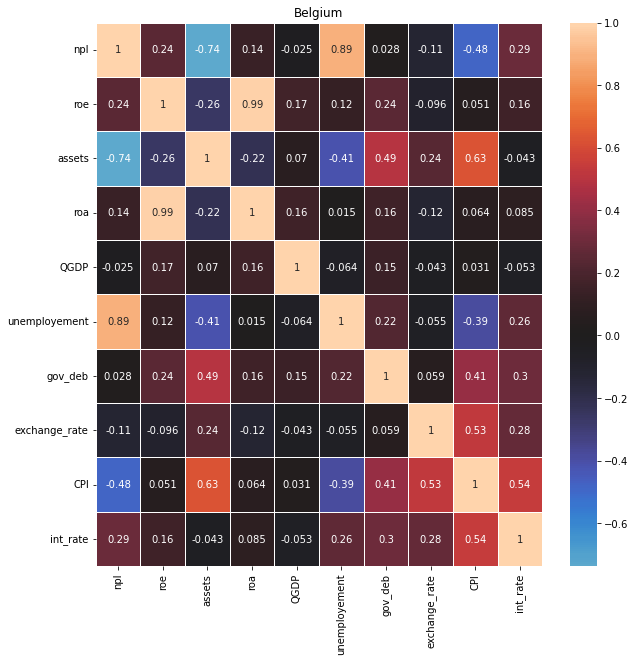

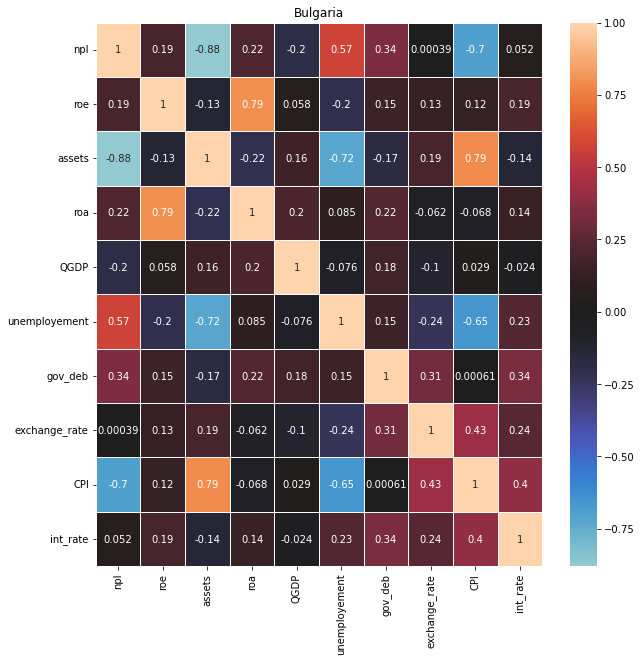

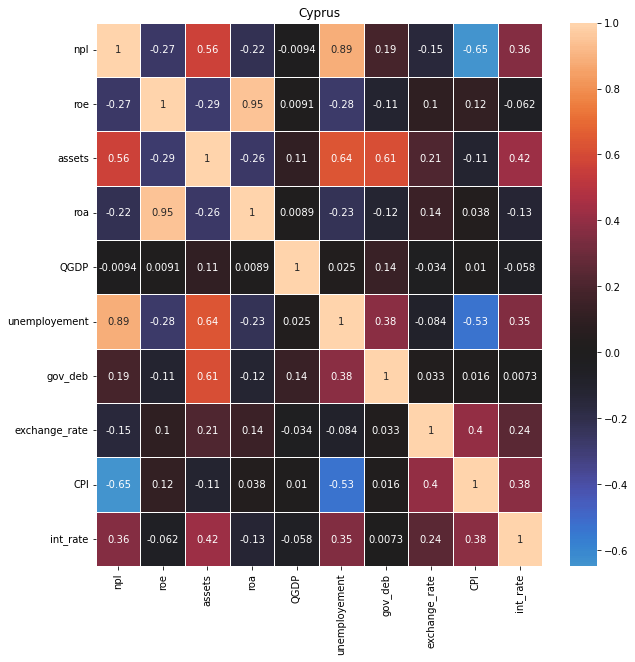

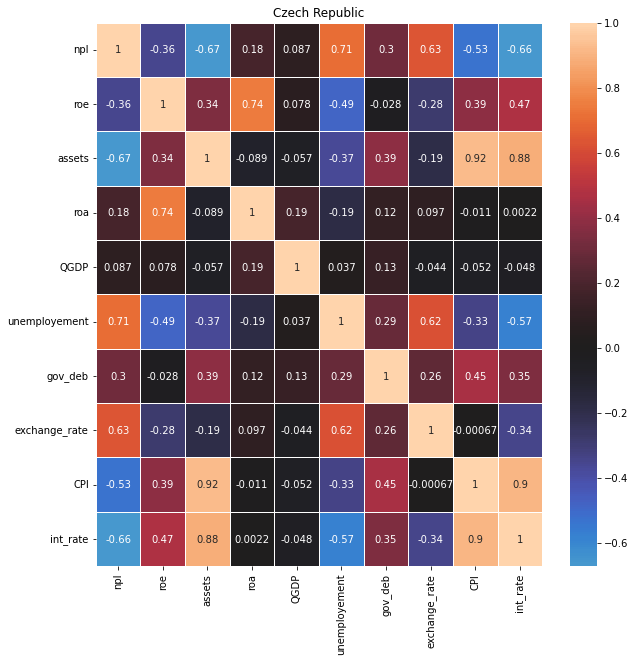

...

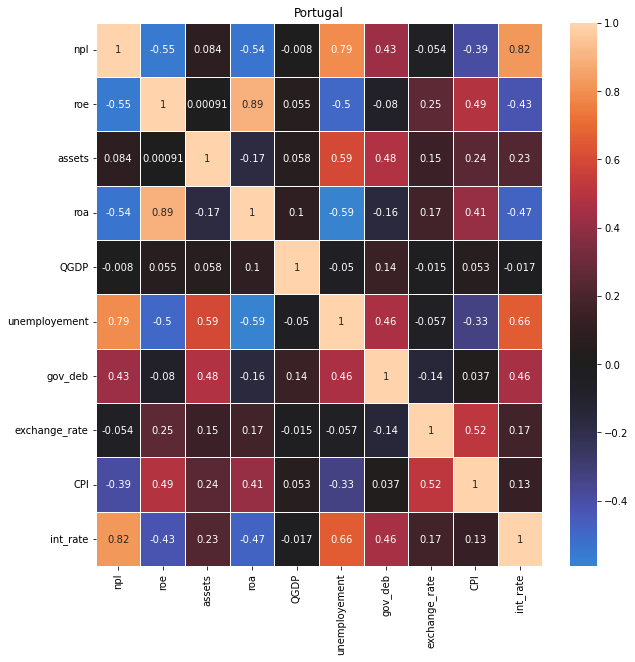

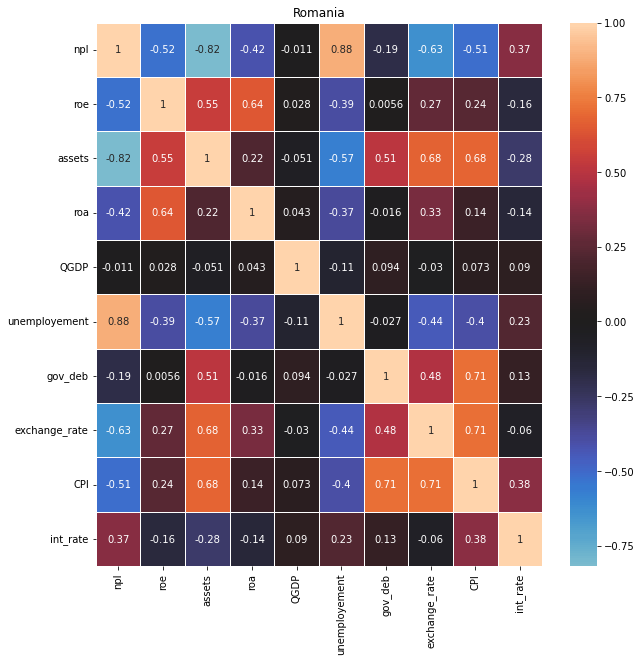

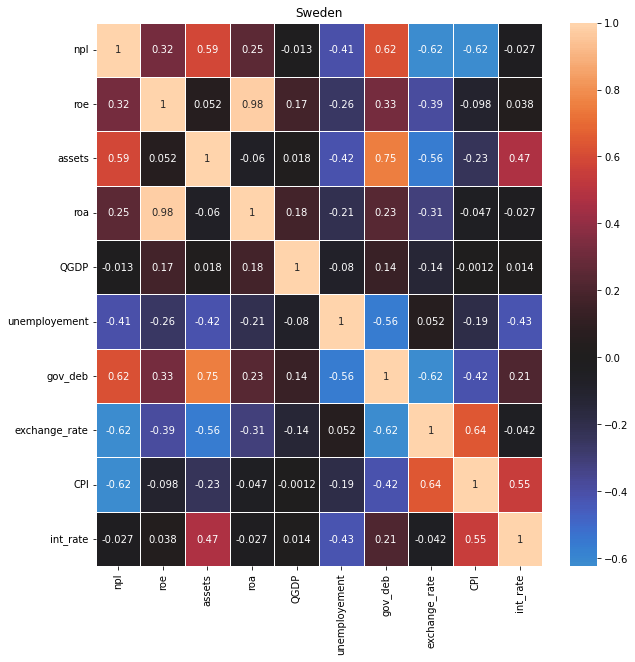

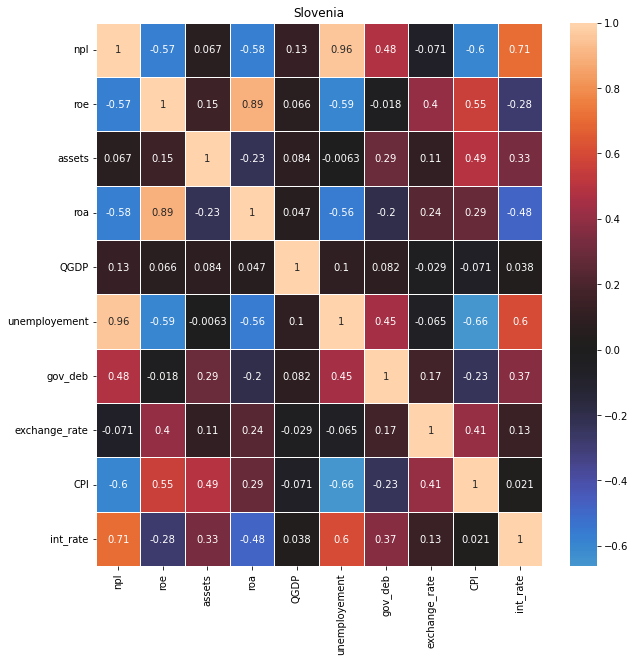

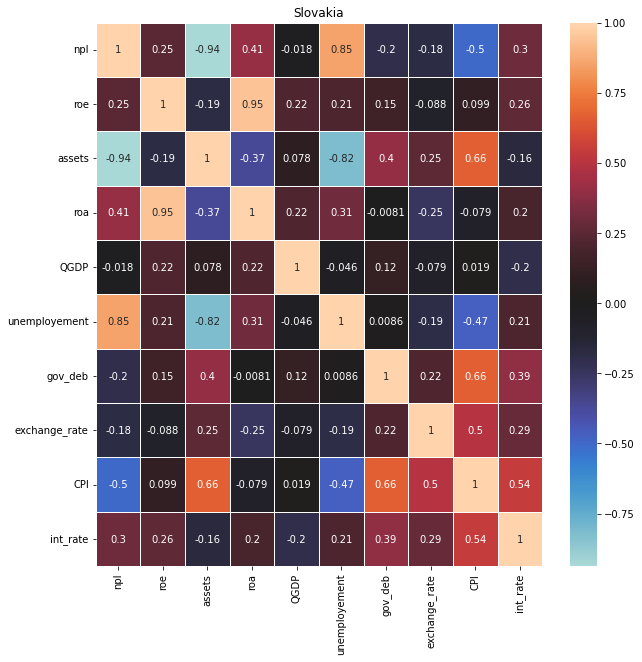

In [18]:
for item in country_name:
    corr = dict_df[item].corr()

    plt.figure(figsize=(10,10))

    ax = sns.heatmap(corr, annot=True, linewidths=1, center=0)
    
    ax.set_title(item)

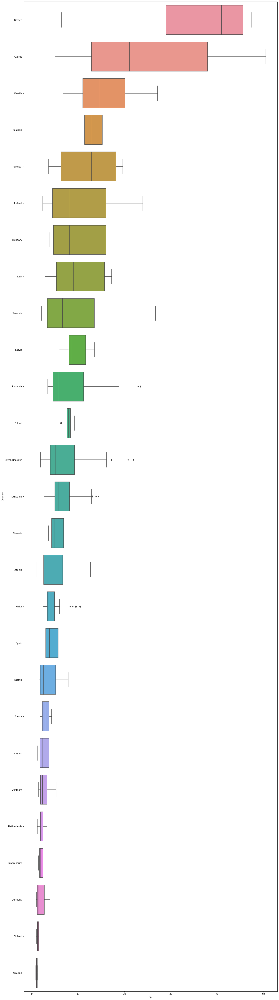

In [19]:
plt.figure(figsize=(20, 80))
order = df.groupby(by=["Country"])["npl"].mean().sort_values().iloc[::-1].index
ax = sns.boxplot(y="Country", x="npl", data=df, order = order)

# Pre-processing

In [20]:
variables=df.select_dtypes(include=['object'])
variables.head()

,Country
0,Austria
1,Austria
2,Austria
3,Austria
4,Austria


In [21]:
dummies=pd.get_dummies(variables)


In [22]:
#df.info()

In [23]:
df4=pd.concat([df,dummies],axis=1)
df4=df4.drop(['Country'],axis=1)


In [24]:
#df4.info()

In [25]:
#df.tail(20)

In [26]:
X=df4.drop(['npl'],axis=1)
y=df4['npl']


In [27]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=10)


In [28]:
# performing preprocessing part

# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc = StandardScaler()

# Train the model by calling a method fit_transform()
X_train = sc.fit_transform(X_train)

# Transform the data into standised form
X_test = sc.transform(X_test)

# LinearRegression

In [29]:
model=LinearRegression()


In [30]:
model.fit(X_train,y_train)


LinearRegression()

In [31]:
model.score(X_train,y_train)


0.8601903432242208

In [32]:
model.score(X_test,y_test)


0.8636199612872981

In [33]:
y_pred_regression=model.predict(X_test)
#predictions

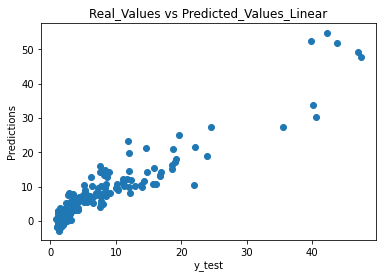

In [34]:
plt.scatter(y_test,y_pred_regression)
plt.xlabel('y_test')
plt.ylabel('Predictions')
p = plt.title('Real_Values vs Predicted_Values_Linear')

In [35]:
df_linear = pd.DataFrame({'Real_Values':y_test, 'Predicted_Values_Linear':y_pred_regression})
df_linear

,Real_Values,Predicted_Values_Linear
771,1.0137,-1.754002
239,2.1564,2.676647
68,8.6880,8.182564
720,14.0169,9.834559
122,40.4970,30.343350
...,...,...
194,1.5670,-1.815620
153,21.8844,10.351901
642,1.3137,-2.798066
591,12.1142,8.125189


# Linear Assumptions 

In [36]:
residual= y_test - y_pred_regression
mean_residuals = np.mean(residual)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals -0.2931173348312812


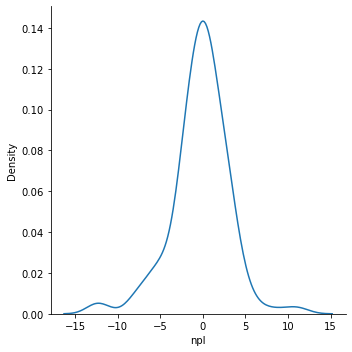

In [37]:
sns.displot(residual,kind="kde")

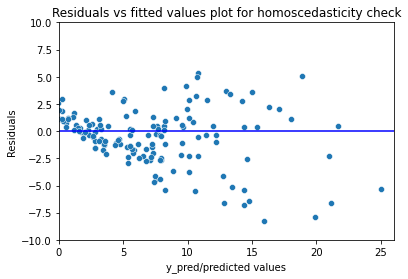

In [38]:
p = sns.scatterplot(y_pred_regression,residual)
plt.xlabel('y_pred/predicted values')
plt.ylabel('Residuals')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='blue')
p = plt.title('Residuals vs fitted values plot for homoscedasticity check')

In [39]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residual, X_test)
lzip(name, test)

[('F statistic', 0.9061736761223725), ('p-value', 0.6331369070284012)]

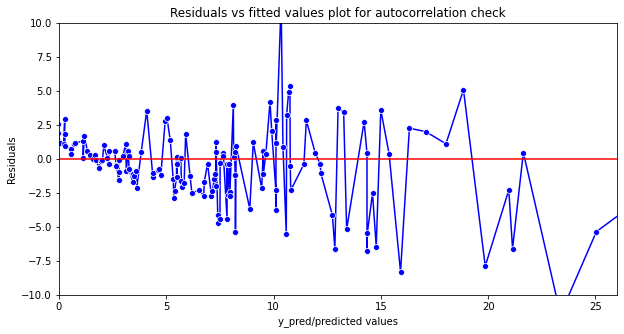

In [40]:
plt.figure(figsize=(10,5))
p = sns.lineplot(y_pred_regression,residual,marker='o',color='blue')
plt.xlabel('y_pred/predicted values')
plt.ylabel('Residuals')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='red')
p = plt.title('Residuals vs fitted values plot for autocorrelation check')

# Ridge Regression


In [41]:

# Train the Ridge() mode by calling a fit() method
ridge = Ridge().fit(X_train, y_train)

# Display the score by using ridge object
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))

Training set score: 0.86
Test set score: 0.87


In [42]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

# cross validation
folds = 5


ridge = Ridge()


model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2',
                        #scoring= 'neg_mean_absolute_error',
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [43]:
print('Best Score: %s' % model_cv.best_score_)
print('Best Hyperparameters: %s' % model_cv.best_params_)


Best Score: 0.8236575947881832
Best Hyperparameters: {'alpha': 0.5}


In [44]:
# alpha = 1000 is a parameter using a fit() method
ridge = Ridge(alpha = 0.5).fit(X_train, y_train)

# Display the score values for Ridge function
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))

Training set score: 0.86
Test set score: 0.87


# Lasso

In [45]:
lasso = Lasso()

# cross validation
model_cv_lasso = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [46]:
print('Best Score: %s' % model_cv_lasso.best_score_)
print('Best Hyperparameters: %s' % model_cv_lasso.best_params_)

Best Score: 0.8234925518514504
Best Hyperparameters: {'alpha': 0.001}


In [47]:
# we increase the default setting of "max_iter",
# otherwise the model would warn us that we should increase max_iter.
lasso = Lasso(alpha=0.01).fit(X_train, y_train)
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))

Training set score: 0.86
Test set score: 0.87


# Random Forest

In [48]:
model_rf=RandomForestRegressor()


In [49]:
model_rf.fit(X_train,y_train)


RandomForestRegressor()

In [50]:
model_rf.score(X_train,y_train)


0.9942584686817967

In [51]:
model_rf.score(X_test,y_test)


0.9771568433994253

In [52]:
param_grid = {
    'max_depth': [5,10,20],
    'max_features' : [3,10,20,38],
    'n_estimators': [20,50]}

grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=10), 
param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True, random_state=10))


grid_search.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=10, shuffle=True),
             estimator=RandomForestRegressor(random_state=10),
             param_grid={'max_depth': [5, 10, 20],
                         'max_features': [3, 10, 20, 38],
                         'n_estimators': [20, 50]})

In [53]:
grid_search.best_score_


0.9396271540561763

In [54]:
grid_search.best_params_

{'max_depth': 20, 'max_features': 20, 'n_estimators': 50}

In [128]:
model_rf = RandomForestRegressor(n_estimators = 50, max_features= 10, max_depth= 20,random_state = 10)
model_rf.fit(X_train, y_train)

RandomForestRegressor(max_depth=20, max_features=10, n_estimators=50,
                      random_state=10)

In [129]:
model_rf.score(X_train,y_train)


0.9917782126944046

In [56]:
model_rf.score(X_test,y_test)


0.9703361402354505

In [57]:
y_pred_rf=model_rf.predict(X_test)
#prediction
df_rf = pd.DataFrame({'Real_Values1':y_test, 'Predicted_Values_RF':y_pred_rf})

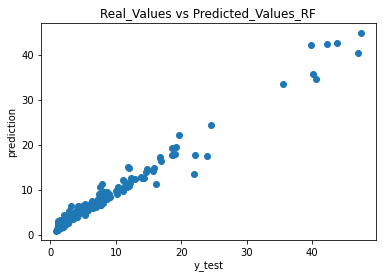

In [58]:
plt.scatter(y_test,y_pred_rf) #c='#bcbd22'
plt.xlabel('y_test')
plt.ylabel('prediction')
p = plt.title('Real_Values vs Predicted_Values_RF')


# Decision Tree Regressor Model


In [59]:
regressor=DecisionTreeRegressor()


In [60]:
regressor.fit(X_train,y_train)


DecisionTreeRegressor()

In [61]:
regressor.score(X_test,y_test)


0.9210308680757666

In [62]:
regressor.score(X_train,y_train)


1.0

In [63]:
param_grid = {
    'max_depth': [5,10,20]}
    #'max_features' : [3,5,8,38]}
    #'n_estimators': [20,50]}

grid_search = GridSearchCV(estimator=DecisionTreeRegressor(random_state=10), 
param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True, random_state=10))


grid_search.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=10, shuffle=True),
             estimator=DecisionTreeRegressor(random_state=10),
             param_grid={'max_depth': [5, 10, 20]})

In [64]:
grid_search.best_score_


0.8764140674679824

In [65]:
grid_search.best_params_

{'max_depth': 20}

In [66]:
regressor=DecisionTreeRegressor(max_depth= 20,random_state = 10 )


In [67]:
regressor.fit(X_train,y_train)


DecisionTreeRegressor(max_depth=20, random_state=10)

In [68]:
regressor.score(X_train,y_train)


0.9999998886862149

In [69]:
regressor.score(X_test,y_test)


0.9256952977905639

In [70]:
y_pred_dt = regressor.predict(X_test)


In [71]:
df_dt = pd.DataFrame({'Real_Values2':y_test, 'Predicted_Values_DT':y_pred_dt})

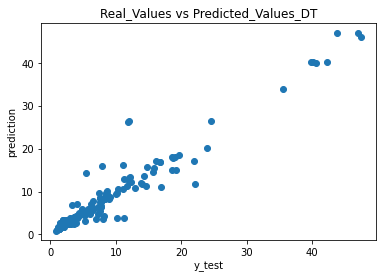

In [72]:
plt.scatter(y_test,y_pred_dt)
plt.xlabel('y_test')
plt.ylabel('prediction')
p = plt.title('Real_Values vs Predicted_Values_DT')

# SVM


In [73]:
from sklearn.svm import SVR
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train, y_train)

SVR()

In [74]:
regressor.score(X_test,y_test)

0.5533338100983145

In [75]:
modela = SVR(kernel = 'rbf')
modela.fit(X_train, y_train)
y_pred = modela.predict(X_test)
modela.score(X_test,y_test)

0.5533338100983145

In [76]:
#parameters = {'kernel': ('linear', 'rbf','poly'), 'C':[1.5, 10],'gamma': [1e-7, 1e-4],'epsilon':[0.1,0.2,0.5,0.3]}
#svr = svm.SVR()
#clf = GridSearchCV(svr, parameters)
#clf.fit(X,y)
#clf.best_params_

In [77]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 10)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVR(kernel="rbf")#rbf

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=10, shuffle=True),
             estimator=SVR(),
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             return_train_score=True, scoring='accuracy', verbose=1)

In [78]:
#prediction=modela.predict(X_test)
#prediction

In [79]:
#print the best parameters from all possible combinations
print("best parameters are: ", model_cv.best_params_)
#Results:

best parameters are:  {'C': 1, 'gamma': 0.01}


In [80]:
model = SVR(kernel = 'linear',C= 1, gamma= 0.01)
model.fit(X_train, y_train)
y_pred_svm = model.predict(X_test)
model.score(X_test,y_test)

0.8788334507471185

In [81]:
df_svm = pd.DataFrame({'Real Values':y_test, 'Predicted_Values_':y_pred_svm})
df_svm.head()

,Real Values,Predicted_Values_
771,1.0137,-1.126027
239,2.1564,2.939971
68,8.6880,10.108737
720,14.0169,11.254275
122,40.4970,27.206868


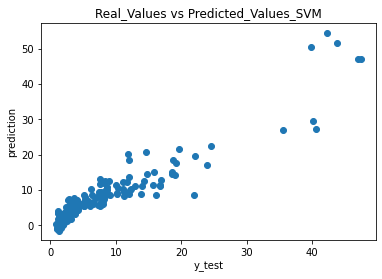

In [82]:
plt.scatter(y_test,y_pred_svm)
plt.xlabel('y_test')
plt.ylabel('prediction')
p = plt.title('Real_Values vs Predicted_Values_SVM')

# KNN

In [125]:
model=neighbors.KNeighborsRegressor()
model.fit(X_train,y_train)


KNeighborsRegressor()

In [126]:
model.score(X_train,y_train)

0.948996578873188

In [127]:
model.score(X_test,y_test)

0.9567529296698589

In [83]:
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train, y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 2.1024058962189343
RMSE value for k=  2 is: 1.7490571002727786
RMSE value for k=  3 is: 1.596921145514159
RMSE value for k=  4 is: 1.6558789278238646
RMSE value for k=  5 is: 1.9219694988938725
RMSE value for k=  6 is: 1.9726663011238539
RMSE value for k=  7 is: 2.2477298672706008
RMSE value for k=  8 is: 2.349983459513536
RMSE value for k=  9 is: 2.5506785389584694
RMSE value for k=  10 is: 2.6519650159683263
RMSE value for k=  11 is: 2.8339860569278965
RMSE value for k=  12 is: 2.917956646551236
RMSE value for k=  13 is: 2.9852914772039547
RMSE value for k=  14 is: 3.1572452687142527
RMSE value for k=  15 is: 3.2735181736558454
RMSE value for k=  16 is: 3.3920870486657235
RMSE value for k=  17 is: 3.5185466910589116
RMSE value for k=  18 is: 3.6684531652124677
RMSE value for k=  19 is: 3.7737212707171888
RMSE value for k=  20 is: 3.8786714412201184


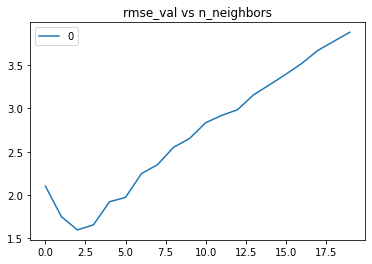

In [84]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()
p = plt.title('rmse_val vs n_neighbors')

In [121]:
from sklearn.model_selection import GridSearchCV
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]}

knn = neighbors.KNeighborsRegressor()

model = GridSearchCV(knn, params, cv=5)
model.fit(X_train,y_train)
model.best_params_

{'n_neighbors': 2}

In [122]:
model.best_score_


0.9241318960311954

In [86]:
knn = neighbors.KNeighborsRegressor()


In [87]:
model=neighbors.KNeighborsRegressor(n_neighbors =2)#n_neighbors =2
#model=neighbors.KNeighborsRegressor(algorithm='ball_tree',n_neighbors =10)


In [88]:
model.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=2)

In [89]:
model.score(X_train,y_train)

0.9822755672287303

In [90]:
model.score(X_test,y_test)

0.9641844449764271

In [91]:
y_pred_knn=model.predict(X_test)
#y_pred_knn

In [92]:
df_knn = pd.DataFrame({'Real_Values3':y_test, 'Predicted_Values_KNN':y_pred_knn})

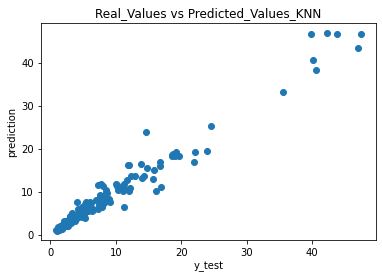

In [93]:
plt.scatter(y_test,y_pred_knn)
plt.xlabel('y_test')
plt.ylabel('prediction')
p = plt.title('Real_Values vs Predicted_Values_KNN')

In [94]:
MSE_Regression = mean_squared_error(y_test, y_pred_regression)
MSE_RF = mean_squared_error(y_test, y_pred_rf)
MSE_DT = mean_squared_error(y_test, y_pred_dt)
MSE_KNN = mean_squared_error(y_test, y_pred_knn)
MSE_SVM = mean_squared_error(y_test, y_pred_svm)

 
print("MSE_Regression:",MSE_Regression)
print("MSE_Random Forest:",MSE_RF)
print("MSE_Decision Tree:",MSE_DT)
print("MSE_KNN:",MSE_KNN)
print("MSE_SVM:",MSE_SVM)

MSE_Regression: 11.648958534316177
MSE_Random Forest: 2.5337510945641424
MSE_Decision Tree: 6.3467674823428375
MSE_KNN: 3.0592007400146204
MSE_SVM: 10.349491914769034


,R Square Score
KNeighborsRegressor,0.924132
RandomForest,0.917952
DecisionTreeRegressor,0.890919
Ridge,0.823658
Linear,0.823577
Lasso,0.823493
SVM Linear,0.780275


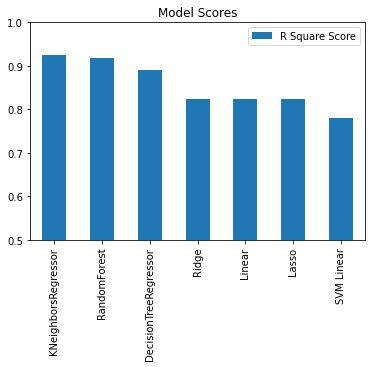

In [95]:
# R2 Score

def lets_try(X_train,y_train):
    results={}
    def test_model(clf):
        
        #cv = KFold(n_splits=5,shuffle=True,random_state=10)
        r2 = make_scorer(r2_score)
        #r2_val_score = cross_val_score(clf, X_train, y_train, cv=cv,scoring=r2)
        r2_val_score = cross_val_score(clf, X_train, y_train,scoring=r2)
        scores=[r2_val_score.mean()]
        return scores

    clf = linear_model.LinearRegression()
    results["Linear"]=test_model(clf)
    
    clf = linear_model.Ridge(alpha=0.5)#alpha=0.5
    results["Ridge"]=test_model(clf)
    
    clf = DecisionTreeRegressor(max_depth= 20,random_state=10)#max_depth= 20
    results["DecisionTreeRegressor"]=test_model(clf)
    
    #clf = linear_model.HuberRegressor()
    #results["Hubber"]=test_model(clf)
    
    clf = linear_model.Lasso(alpha=0.001)#alpha=0.01
    results["Lasso"]=test_model(clf)
    
    #clf = BaggingRegressor()
    #results["Bagging"]=test_model(clf)
    
    clf = RandomForestRegressor(n_estimators = 50, max_features= 10, max_depth= 20,random_state=10)#n_estimators = 50, max_features= 10, max_depth= 20
    results["RandomForest"]=test_model(clf)
    
    clf = neighbors.KNeighborsRegressor(n_neighbors =2)#n_neighbors =2
    results["KNeighborsRegressor"]=test_model(clf)
    
    #clf = svm.SVR(kernel="rbf")
    #results["SVM RBF"]=test_model(clf)
    
    clf = svm.SVR(kernel="linear")
    results["SVM Linear"]=test_model(clf)
    
    results = pd.DataFrame.from_dict(results,orient='index')
    results.columns=["R Square Score"] 
    results=results.sort_values("R Square Score",ascending=False)
    results.plot(kind="bar",title="Model Scores",color='#1f77b4')
    axes = plt.gca()
    axes.set_ylim([0.5,1])
    return results

lets_try(X_train,y_train)

# PCA

In [96]:
pca = PCA(whiten=True)
pca.fit(df4)
variance = pd.DataFrame(pca.explained_variance_ratio_)
np.cumsum(pca.explained_variance_ratio_)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.])

In [97]:
pca = PCA(n_components=10,whiten=True)
pca = pca.fit(X_train)
dataPCA = pca.transform(X_train)

,R Square Score
KNeighborsRegressor,0.931235
RandomForest,0.887639
DecisionTreeRegressor,0.796572
Lasso,0.600712
Ridge,0.600491
Linear,0.600431
SVM Linear,0.529080


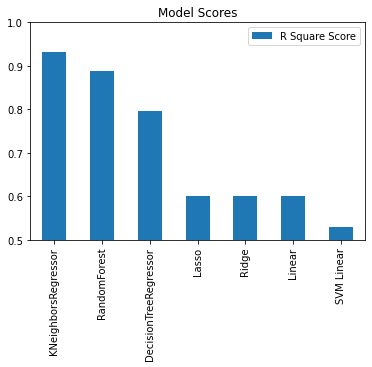

In [98]:
# R2 Score

def lets_try(dataPCA,y_train):
    results={}
    def test_model(clf):
        
        #cv = KFold(n_splits=5,shuffle=True,random_state=10)
        r2 = make_scorer(r2_score)
        r2_val_score = cross_val_score(clf, dataPCA, y_train,scoring=r2)
        scores=[r2_val_score.mean()]
        return scores

    clf = linear_model.LinearRegression()
    results["Linear"]=test_model(clf)
    
    clf = linear_model.Ridge(alpha=0.5)
    results["Ridge"]=test_model(clf)
    
    clf = DecisionTreeRegressor(max_depth= 20)
    results["DecisionTreeRegressor"]=test_model(clf)
    
    #clf = linear_model.HuberRegressor()
    #results["Hubber"]=test_model(clf)
    
    clf = linear_model.Lasso(alpha=0.01)
    results["Lasso"]=test_model(clf)
    
    #clf = BaggingRegressor()
    #results["Bagging"]=test_model(clf)
    
    clf = RandomForestRegressor(n_estimators = 50, max_features= 10, max_depth= 20)
    results["RandomForest"]=test_model(clf)
    
    clf = neighbors.KNeighborsRegressor(n_neighbors =2)
    results["KNeighborsRegressor"]=test_model(clf)
    
    #clf = svm.SVR(kernel="rbf")
    #results["SVM RBF"]=test_model(clf)
    
    clf = svm.SVR(kernel="linear")
    results["SVM Linear"]=test_model(clf)
    
    results = pd.DataFrame.from_dict(results,orient='index')
    results.columns=["R Square Score"] 
    results=results.sort_values("R Square Score",ascending=False)
    results.plot(kind="bar",title="Model Scores",color='#1f77b4')
    axes = plt.gca()
    axes.set_ylim([0.5,1])
    return results

lets_try(dataPCA,y_train)


In [99]:
dash = pd.concat([df_linear,df_rf,df_dt,df_knn], axis=1)
dash.head()

,Real_Values,Predicted_Values_Linear,Real_Values1,Predicted_Values_RF,Real_Values2,Predicted_Values_DT,Real_Values3,Predicted_Values_KNN
771,1.0137,-1.754002,1.0137,1.361340,1.0137,0.9775,1.0137,1.00320
239,2.1564,2.676647,2.1564,4.360576,2.1564,2.8578,2.1564,3.22665
68,8.6880,8.182564,8.6880,8.121082,8.6880,9.3591,8.6880,8.47835
720,14.0169,9.834559,14.0169,12.736446,14.0169,11.8782,14.0169,13.28615
122,40.4970,30.343350,40.4970,34.663424,40.4970,40.0351,40.4970,38.25335


In [100]:
dash = dash.drop(["Real_Values1","Real_Values2","Real_Values3"], axis=1)


In [101]:
dash.to_csv('dash.csv')

In [102]:
#dash.info()

In [103]:
#test=pd.DataFrame(X_test)

In [104]:
#test.to_csv('test.csv')

In [105]:
#test.head(20)

In [106]:
#test.info()

# ANN

In [130]:
from keras import Sequential
from keras.layers import Dense

In [132]:

# build the model!
model = Sequential()
model.add(Dense(100, input_shape=(X_train.shape[1],), activation='relu')) # (features,)
model.add(Dense(50, activation='relu'))
#model.add(Dropout(0.5))
model.add(Dense(20, activation='relu'))
#model.add(Dropout(0.5))
model.add(Dense(1, activation='linear')) # output node
model.summary() # see what your model looks like

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 100)               3900      
                                                                 
 dense_9 (Dense)             (None, 50)                5050      
                                                                 
 dense_10 (Dense)            (None, 20)                1020      
                                                                 
 dense_11 (Dense)            (None, 1)                 21        
                                                                 
Total params: 9,991
Trainable params: 9,991
Non-trainable params: 0
_________________________________________________________________


In [133]:
# compile the model
model.compile(optimizer='Adamax', loss='mse', metrics=['mae','accuracy'])

# early stopping callback
es = EarlyStopping(monitor='val_loss',
                   mode='min',
                   patience=50,
                   restore_best_weights = True)

# fit the model!
# attach it to a new variable called 'history' in case
# to look at the learning curves
history = model.fit(X_train, y_train,
                    validation_data = (X_test, y_test),
                    callbacks=[es],
                    epochs=500,
                    batch_size=20,
                    verbose=1)

Epoch 1/500
34/34 [==============================] - 1s 8ms/step - loss: 137.8064 - mae: 7.5378 - accuracy: 0.0000e+00 - val_loss: 125.5435 - val_mae: 6.5783 - val_accuracy: 0.0000e+00
Epoch 2/500
34/34 [==============================] - 0s 2ms/step - loss: 108.9908 - mae: 5.9010 - accuracy: 0.0000e+00 - val_loss: 93.4944 - val_mae: 5.1936 - val_accuracy: 0.0000e+00
Epoch 3/500
34/34 [==============================] - 0s 2ms/step - loss: 80.8802 - mae: 4.9761 - accuracy: 0.0000e+00 - val_loss: 63.0826 - val_mae: 4.5179 - val_accuracy: 0.0000e+00
Epoch 4/500
34/34 [==============================] - 0s 4ms/step - loss: 57.6795 - mae: 4.6095 - accuracy: 0.0000e+00 - val_loss: 45.0615 - val_mae: 4.1393 - val_accuracy: 0.0000e+00
Epoch 5/500
34/34 [==============================] - 0s 4ms/step - loss: 42.6413 - mae: 4.2188 - accuracy: 0.0000e+00 - val_loss: 29.3613 - val_mae: 3.6146 - val_accuracy: 0.0000e+00
Epoch 6/500
34/34 [==============================] - 0s 4ms/step - loss: 30.2699 -

Epoch 46/500
34/34 [==============================] - 0s 3ms/step - loss: 1.4885 - mae: 0.6941 - accuracy: 0.0000e+00 - val_loss: 4.8032 - val_mae: 1.0485 - val_accuracy: 0.0000e+00
Epoch 47/500
34/34 [==============================] - 0s 3ms/step - loss: 1.4530 - mae: 0.6668 - accuracy: 0.0000e+00 - val_loss: 4.3814 - val_mae: 1.0134 - val_accuracy: 0.0000e+00
Epoch 48/500
34/34 [==============================] - 0s 4ms/step - loss: 1.4372 - mae: 0.6657 - accuracy: 0.0000e+00 - val_loss: 4.2875 - val_mae: 0.9926 - val_accuracy: 0.0000e+00
Epoch 49/500
34/34 [==============================] - 0s 3ms/step - loss: 1.3993 - mae: 0.6458 - accuracy: 0.0000e+00 - val_loss: 4.0375 - val_mae: 0.9646 - val_accuracy: 0.0000e+00
Epoch 50/500
34/34 [==============================] - 0s 4ms/step - loss: 1.3211 - mae: 0.6344 - accuracy: 0.0000e+00 - val_loss: 4.4857 - val_mae: 0.9946 - val_accuracy: 0.0000e+00
Epoch 51/500
34/34 [==============================] - 0s 3ms/step - loss: 1.2866 - mae: 0.

34/34 [==============================] - 0s 3ms/step - loss: 0.6031 - mae: 0.4282 - accuracy: 0.0000e+00 - val_loss: 2.3458 - val_mae: 0.7665 - val_accuracy: 0.0000e+00
Epoch 92/500
34/34 [==============================] - 0s 3ms/step - loss: 0.5847 - mae: 0.4129 - accuracy: 0.0000e+00 - val_loss: 2.3549 - val_mae: 0.7556 - val_accuracy: 0.0000e+00
Epoch 93/500
34/34 [==============================] - 0s 4ms/step - loss: 0.5900 - mae: 0.4126 - accuracy: 0.0000e+00 - val_loss: 2.4413 - val_mae: 0.7729 - val_accuracy: 0.0000e+00
Epoch 94/500
34/34 [==============================] - 0s 2ms/step - loss: 0.5691 - mae: 0.4094 - accuracy: 0.0000e+00 - val_loss: 2.3401 - val_mae: 0.7534 - val_accuracy: 0.0000e+00
Epoch 95/500
34/34 [==============================] - 0s 3ms/step - loss: 0.5766 - mae: 0.4127 - accuracy: 0.0000e+00 - val_loss: 2.0657 - val_mae: 0.7382 - val_accuracy: 0.0000e+00
Epoch 96/500
34/34 [==============================] - 0s 3ms/step - loss: 0.5502 - mae: 0.4078 - accura

Epoch 136/500
34/34 [==============================] - 0s 3ms/step - loss: 0.3727 - mae: 0.3296 - accuracy: 0.0000e+00 - val_loss: 1.8381 - val_mae: 0.6861 - val_accuracy: 0.0000e+00
Epoch 137/500
34/34 [==============================] - 0s 3ms/step - loss: 0.3576 - mae: 0.3222 - accuracy: 0.0000e+00 - val_loss: 1.9682 - val_mae: 0.6975 - val_accuracy: 0.0000e+00
Epoch 138/500
34/34 [==============================] - 0s 4ms/step - loss: 0.3599 - mae: 0.3203 - accuracy: 0.0000e+00 - val_loss: 1.8079 - val_mae: 0.6802 - val_accuracy: 0.0000e+00
Epoch 139/500
34/34 [==============================] - 0s 3ms/step - loss: 0.3529 - mae: 0.3275 - accuracy: 0.0000e+00 - val_loss: 2.0310 - val_mae: 0.7069 - val_accuracy: 0.0000e+00
Epoch 140/500
34/34 [==============================] - 0s 3ms/step - loss: 0.3754 - mae: 0.3389 - accuracy: 0.0000e+00 - val_loss: 1.9992 - val_mae: 0.7001 - val_accuracy: 0.0000e+00
Epoch 141/500
34/34 [==============================] - 0s 3ms/step - loss: 0.3616 - m

Epoch 181/500
34/34 [==============================] - 0s 3ms/step - loss: 0.2526 - mae: 0.2740 - accuracy: 0.0000e+00 - val_loss: 1.9371 - val_mae: 0.6853 - val_accuracy: 0.0000e+00
Epoch 182/500
34/34 [==============================] - 0s 3ms/step - loss: 0.2822 - mae: 0.2787 - accuracy: 0.0000e+00 - val_loss: 1.7909 - val_mae: 0.6683 - val_accuracy: 0.0000e+00
Epoch 183/500
34/34 [==============================] - 0s 4ms/step - loss: 0.2653 - mae: 0.2751 - accuracy: 0.0000e+00 - val_loss: 1.9614 - val_mae: 0.6885 - val_accuracy: 0.0000e+00
Epoch 184/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2749 - mae: 0.2791 - accuracy: 0.0000e+00 - val_loss: 1.8513 - val_mae: 0.6828 - val_accuracy: 0.0000e+00
Epoch 185/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2734 - mae: 0.2883 - accuracy: 0.0000e+00 - val_loss: 1.8805 - val_mae: 0.6765 - val_accuracy: 0.0000e+00
Epoch 186/500
34/34 [==============================] - 0s 3ms/step - loss: 0.2465 - m

Epoch 226/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2015 - mae: 0.2450 - accuracy: 0.0000e+00 - val_loss: 1.9157 - val_mae: 0.6804 - val_accuracy: 0.0000e+00
Epoch 227/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2095 - mae: 0.2427 - accuracy: 0.0000e+00 - val_loss: 1.9176 - val_mae: 0.6876 - val_accuracy: 0.0000e+00
Epoch 228/500
34/34 [==============================] - 0s 2ms/step - loss: 0.1984 - mae: 0.2332 - accuracy: 0.0000e+00 - val_loss: 1.8777 - val_mae: 0.6824 - val_accuracy: 0.0000e+00
Epoch 229/500
34/34 [==============================] - 0s 3ms/step - loss: 0.2077 - mae: 0.2416 - accuracy: 0.0000e+00 - val_loss: 1.8208 - val_mae: 0.6770 - val_accuracy: 0.0000e+00
Epoch 230/500
34/34 [==============================] - 0s 3ms/step - loss: 0.2135 - mae: 0.2572 - accuracy: 0.0000e+00 - val_loss: 1.8214 - val_mae: 0.6983 - val_accuracy: 0.0000e+00


In [134]:
model.evaluate(X_test,y_test)

6/6 [==============================] - 0s 1ms/step - loss: 1.7483 - mae: 0.6675 - accuracy: 0.0000e+00


[1.7483220100402832, 0.6674663424491882, 0.0]

In [111]:
r2_no=metrics.r2_score(y_test,model.predict(X_test))

In [112]:
print('R2 Score                :',r2_no) #0.98273

R2 Score                : 0.9768793271720361


In [113]:
history.history.keys()

dict_keys(['loss', 'mae', 'accuracy', 'val_loss', 'val_mae', 'val_accuracy'])

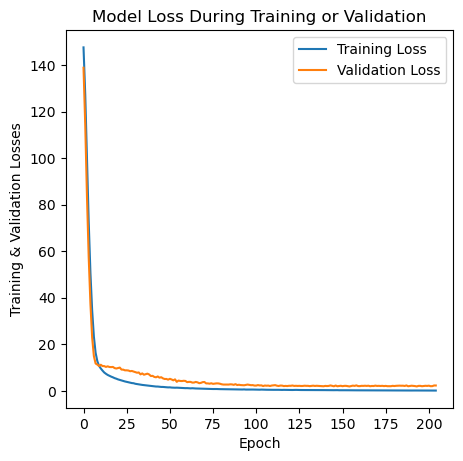

In [114]:
plt.figure(figsize=(5,5),dpi=100)
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])

plt.title('Model Loss During Training or Validation')
plt.ylabel('Training & Validation Losses')
plt.xlabel('Epoch')
plt.legend(['Training Loss', 'Validation Loss'])

In [115]:
y_pred_ann= model.predict(X_test)

In [116]:
from sklearn import metrics #Evaluation of  the explained variance score (R^2)
metrics.explained_variance_score(y_test,y_pred_ann)

0.9769457444795306

In [135]:
from sklearn import metrics
print("MAE:",metrics.mean_absolute_error(y_test,y_pred_ann))
print ("MSE:",metrics.mean_squared_error(y_test,y_pred_ann))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,y_pred_ann)))

MAE: 0.7954044172286987
MSE: 1.9748620223361033
RMSE: 1.405297841148311


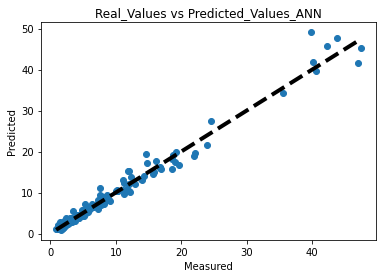

In [136]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred_ann)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
p = plt.title('Real_Values vs Predicted_Values_ANN')
plt.show()

In [119]:
#df_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_ann.round(1)})
#df_results['error'] = (df_results['Actual'] - df_results['Predicted']).abs().round(1)
#df_results.head()

In [120]:
#y_pred_ann